# 1. 라이브러리 및 데이터

In [1]:
import ultralytics
import torch
from ultralytics import YOLO
from pathlib import Path
import os
import random
from PIL import Image
import json
import numpy as np
import cv2
import matplotlib.pyplot as plt
import shutil
import pandas as pd
ultralytics.checks()
torch.cuda.is_available()

Ultralytics YOLOv8.0.136  Python-3.11.4 torch-2.0.1 CUDA:0 (NVIDIA GeForce RTX 3060 Ti, 8192MiB)
Setup complete  (16 CPUs, 63.7 GB RAM, 466.1/931.5 GB disk)


True

## 1-1. Finetuning Dataset

In [3]:
image_path = Path("data/")

def walk_through_dir(dir_path):
    """Walks through dir_path returning its contents"""
    for dirpath, dirnames, filenames in os.walk(dir_path):
        print(f"There are {len(dirnames)} directories and {len(filenames)} files in '{dirpath}'")

In [4]:
walk_through_dir(image_path)

There are 3 directories and 1 files in 'data'
There are 0 directories and 816 files in 'data\train_images'
There are 0 directories and 272 files in 'data\train_labels'
There are 0 directories and 531 files in 'data\valid_images'


In [5]:
train_dir = image_path / "train_images"
train_label_dir = image_path / "train_labels"
valid_dir = image_path / "valid_images"
train_dir, train_label_dir, valid_dir

(WindowsPath('data/train_images'),
 WindowsPath('data/train_labels'),
 WindowsPath('data/valid_images'))

In [6]:
# png 파일 갯수 확인
image_path_list = list(train_dir.glob("*.png"))
len(image_path_list)


272

In [7]:
split_idx = int(len(image_path_list) * 0.8)
split_idx, len(image_path_list) - split_idx

(217, 55)

In [8]:
# Load the JSON file
path = "./data/train_labels/OBJ00028_PS3_K3_NIA0078.json"
with open(path, "r") as json_file:
    data = json.load(json_file)

# Show the keys in the JSON data
data.keys()

dict_keys(['features'])

In [9]:
# bbox features 확인
for feature in data['features']:
    print(feature['properties']['object_imcoords'])

26.86871960170633,100.99485080428859,27.77451663473868,87.177707997163,42.792646366178744,88.16223696543985,41.886849333146394,101.97937977256544
173.2781332774469,25.297148025954257,173.3230360532814,16.64014214917535,191.8626934905256,16.73630496733705,191.81779071469109,25.393310844115955
193.45233240169793,41.58315357036204,193.37573089550054,20.089055612928696,224.27158353088336,19.978947766029947,224.34818503708075,41.473045723463294
226.83103374923755,43.86257985726567,226.76309215649692,24.798421432133686,238.10508018105648,24.75800041201575,238.1730217737971,43.82215883714773
284.302243767138,46.892347042621275,284.20363177766,19.22218927633878,302.8601765749557,19.155700352972808,302.9587885644337,46.8258581192553
261.5500920025639,47.579042869147315,261.51753060974244,38.442437054499536,282.3523903214403,38.36818496732246,282.3849517142617,47.50479078197024
304.5712137025159,45.2267269334503,304.544565011333,37.74920322464348,312.68912114553603,37.72017733723825,312.71576983

## 1-2. Pretraining Dataset

In [23]:
image_path = Path("pretrain_data/")

def walk_through_dir(dir_path):
    """Walks through dir_path returning its contents"""
    for dirpath, dirnames, filenames in os.walk(dir_path):
        print(f"There are {len(dirnames)} directories and {len(filenames)} files in '{dirpath}'")

In [24]:
walk_through_dir(image_path)

There are 2 directories and 0 files in 'pretrain_data'
There are 2 directories and 0 files in 'pretrain_data\Training'
There are 0 directories and 8904 files in 'pretrain_data\Training\data'
There are 0 directories and 4206 files in 'pretrain_data\Training\label'
There are 2 directories and 0 files in 'pretrain_data\valid'
There are 0 directories and 1137 files in 'pretrain_data\valid\data'
There are 0 directories and 538 files in 'pretrain_data\valid\label'


In [34]:
train_dir = image_path / "Training"
# train_label_dir = image_path / "train_labels"
valid_dir = image_path / "Valid"
train_dir, valid_dir

(WindowsPath('pretrain_data/Training'), WindowsPath('pretrain_data/Valid'))

In [31]:
# train png 파일 갯수 확인
train_image_path_list = list(train_dir.glob("data/*.png"))
len(train_image_path_list)


2968

In [32]:
# train label 파일 갯수 확인
train_label_path_list = list(train_dir.glob("label/*.json"))
len(train_label_path_list)


2968

In [35]:
# valid png 파일 갯수 확인
valid_image_path_list = list(valid_dir.glob("data/*.png"))
len(valid_image_path_list)


379

In [36]:
# valid label 파일 갯수 확인
valid_label_path_list = list(valid_dir.glob("label/*.json"))
len(valid_label_path_list)


379

In [38]:
# Load the JSON file
path =   "./pretrain_data/Training/label/BLD00001_PS3_K3A_NIA0276.json"
with open(path, "r") as json_file:
    data = json.load(json_file)

# Show the keys in the JSON data
data.keys()

dict_keys(['features', 'type'])

In [18]:
# bbox building features 확인
for feature in data['features']:
    print(feature['properties']['building_imcoords'])

386.6471546511307,607.891321754977,364.02794267885247,650.3023442029986,415.6280199906122,677.162658420079,438.954082337024,635.458486346191
257.51930524048487,355.4822300130611,283.91650053848446,370.1473385119497,303.86104809697304,334.3644737746614,276.8772484590179,318.52615659586166
325.21831853363483,192.96600665526813,310.62820583530964,213.20390491423527,331.336752890997,227.7940176125604,345.9268655893221,207.0854705568731
293.9563886618125,169.36560141442175,285.6827816961655,181.5326704815498,302.2299956274596,194.18642231136292,312.4503336438471,181.5326704815498
105.80349390476852,220.4980377175008,142.25679852741985,251.61671239537387,152.92605841697633,231.1672976070573,118.25096377591775,206.2723578647588
129.80932865627062,176.93189316847844,141.36769353662348,189.3793630396277,177.8209981592748,139.58948355503074,163.59531830653285,128.92022366547425
225.2686750174308,166.1818094390883,208.03500589041423,188.33938403096676,216.65184045392252,195.72524222825956,233.270

In [19]:
# Load the JSON file
path =   r"F:\work3\pretrain_data\Training\label\train_objects_labeling\OBJ00013_PS3_K3_NIA0078.json"
with open(path, "r") as json_file:
    data = json.load(json_file)

# Show the keys in the JSON data
data.keys()

dict_keys(['features', 'type'])

In [20]:
# bbox object features 확인
for feature in data['features']:
    print(feature['properties']['object_imcoords'])

469.1820926230315,473.2955533775398,561.6543996724264,473.2955533775399,561.6543996724264,563.5489576573916,469.1820926230315,563.5489576573916
993.6889260747658,339.4410959499382,988.8109258625097,341.53611374679735,985.2668417005333,333.28413454151706,990.1448419127894,331.1891167446579
988.7026551987746,331.54721860229455,984.0900765284824,334.1050737794211,980.882807627531,328.32140773972,985.4953862978231,325.7635525625934
935.9948592758786,141.9939151216178,940.820433867284,138.6361681558302,945.1506126791966,144.85926985584334,940.3250380877912,148.21701682163092
873.1437932557097,45.11725293949537,871.0803203529206,46.16860141314458,868.8697283387977,41.82989085751727,870.9332012415869,40.778542383868064
869.803319942681,46.30678680115171,867.1144048538506,47.5951085227305,864.8233434069176,42.813329568832124,867.512258495748,41.525007847253335
865.0319303000208,48.87218171012941,862.8490323355422,49.85570852685932,860.7155539258595,45.12053954261134,862.898451890338,44.1370127

# 2. 데이터 전처리

## 2-1. Finetunning dataset

In [14]:
# 전체데이터에 적용하여 data2라는 폴더에 YOLO v8 학습용 labeling 데이터셋 생성
# Get a list of all files in the 'data/train_labels' directory
files = os.listdir("data/train_labels")
files = [f for f in files if f.endswith(".json")]

# Split the list of files into training and validation sets
split_idx = int(len(files) * 0.8)  # 80% of the data goes to the training set
train_files = files[:split_idx]
valid_files = files[split_idx:]

# Define a function to process a file and write the output to a .txt file
def process_file(input_filepath, output_filepath):
    with open(input_filepath, "r") as json_file:
        data = json.load(json_file)

    with open(output_filepath, "w") as f:
        for feature in data['features']:
            imcoords = feature['properties']['object_imcoords']
            points = list(map(float, imcoords.split(',')))
            points = [p/1024 for p in points]
            points = [0] + points
            points_str = ' '.join(map(str, points))
            f.write(points_str + "\n")

# Create the output directories if they do not exist
os.makedirs("data2/train/labels", exist_ok=True)
os.makedirs("data2/valid/labels", exist_ok=True)

# Process the training files
for filename in train_files:
    input_filepath = f"data/train_labels/{filename}"
    output_filepath = f"data2/train/labels/{filename.replace('.json', '.txt')}"
    process_file(input_filepath, output_filepath)

# Process the validation files
for filename in valid_files:
    input_filepath = f"data/train_labels/{filename}"
    output_filepath = f"data2/valid/labels/{filename.replace('.json', '.txt')}"
    process_file(input_filepath, output_filepath)

In [15]:
# Get a list of all PNG files in the 'data/train_images' directory
files = os.listdir("data/train_images")
files = [f for f in files if f.endswith(".png")]

# Split the list of files into training and validation sets
split_idx = int(len(files) * 0.8)  # 80% of the data goes to the training set
print(split_idx)
train_files = files[:split_idx]
valid_files = files[split_idx:]

# Create the output directories if they do not exist
os.makedirs("data2/train/images", exist_ok=True)
os.makedirs("data2/valid/images", exist_ok=True)

# Copy the training files
for filename in train_files:
    shutil.copy2(f"data/train_images/{filename}", f"data2/train/images/{filename}")

# Copy the validation files
for filename in valid_files:
    shutil.copy2(f"data/train_images/{filename}", f"data2/valid/images/{filename}")

217


## 2-2. Pretraining dataset

In [39]:
# 전체데이터에 적용하여 pretrain_data2라는 폴더에 YOLO v8 학습용 labeling 데이터셋 생성
# Get a list of all files in the 'data/train_labels' directory

# Define a function to process a file and write the output to a .txt file
def process_file(input_filepath, output_filepath):
    with open(input_filepath, "r") as json_file:
        data = json.load(json_file)

    with open(output_filepath, "w") as f:
        for feature in data['features']:
            if "object" in input_filepath :
                imcoords = feature['properties']['object_imcoords']
            else : 
                imcoords = feature['properties']['building_imcoords']
            try:
                # print(imcoords)
                points = list(map(float, imcoords.split(',')))
                points = [p/1024 for p in points]
                points = [0] + points
                points_str = ' '.join(map(str, points))
                f.write(points_str + "\n")
            except ValueError:
                pass

# Create the output directories if they do not exist
os.makedirs("pretrain_data2/train/labels", exist_ok=True)
os.makedirs("pretrain_data2/valid/labels", exist_ok=True)

# Process the training files
for filename in train_label_path_list:
    input_filepath = f"{filename}"
    output_filepath = f"pretrain_data2/train/labels/{filename.name.replace('.json', '.txt')}"
    process_file(input_filepath, output_filepath)

# Process the validation files
for filename in valid_label_path_list:
    input_filepath = f"{filename}"
    output_filepath = f"pretrain_data2/valid/labels/{filename.name.replace('.json', '.txt')}"
    process_file(input_filepath, output_filepath)


In [41]:
# Get a list of all PNG files in the 'data/train_images' directory




# Create the output directories if they do not exist
os.makedirs("pretrain_data2/train/images", exist_ok=True)
os.makedirs("pretrain_data2/valid/images", exist_ok=True)

# Copy the training files
for filename in train_image_path_list:
    shutil.copy2(f"{filename}", f"pretrain_data2/train/images/{filename.name}")

# Copy the validation files
for filename in valid_image_path_list:
    shutil.copy2(f"{filename}", f"pretrain_data2/valid/images/{filename.name}")

# 3. 탐색적 자료 분석(EDA)

## 3-1. Finetunning Dataset

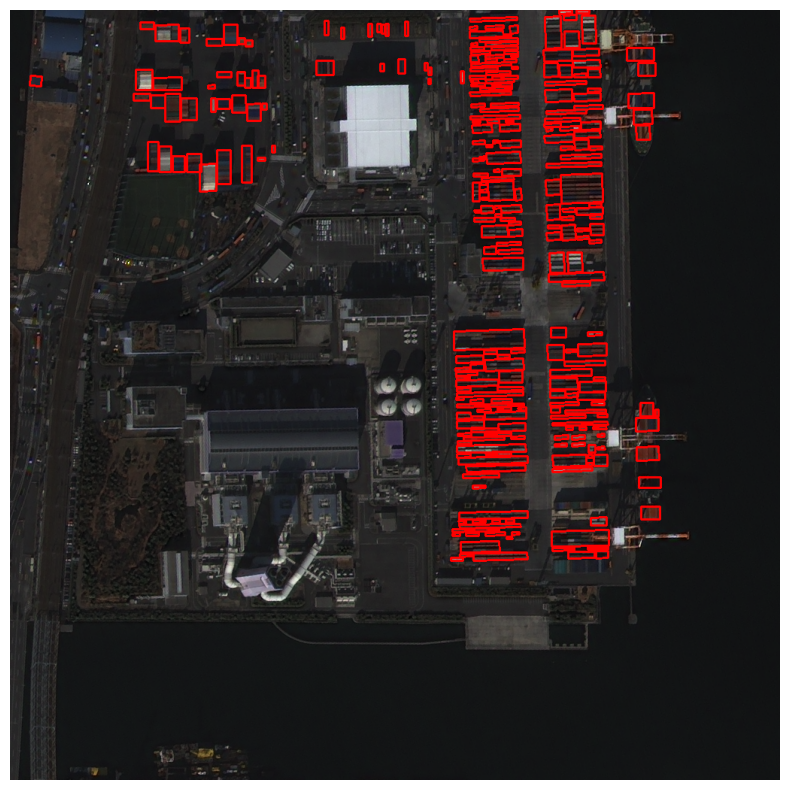

In [42]:
# Load the image
path2 = "./data/train_images/OBJ00028_PS3_K3_NIA0078.png"
img = cv2.imread(path2)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
# Draw bounding boxes on the image
# Load the JSON file
path = "./data/train_labels/OBJ00028_PS3_K3_NIA0078.json"
with open(path, "r") as json_file:
    data = json.load(json_file)

for feature in data['features']:
    imcoords = feature['properties']['object_imcoords']
    points = list(map(float, imcoords.split(',')))
    points = list(zip(points[::2], points[1::2]))  # Group the points
    points = [points[0], points[1], points[2],points[3], points[0]]  # Reorder points to draw bounding box
    points = np.array(points, np.int32)
    points = points.reshape((-1, 1, 2))
    img = cv2.polylines(img, [points], True, (255, 0, 0), 2)  # Draw the bounding box

# Display the image with bounding boxes
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.axis('off')
plt.show();

random image path: data\train_images\OBJ05216_PS3_K3A_NIA0340.png
Image class : train_images
Image height: 1024
Image width: 1024


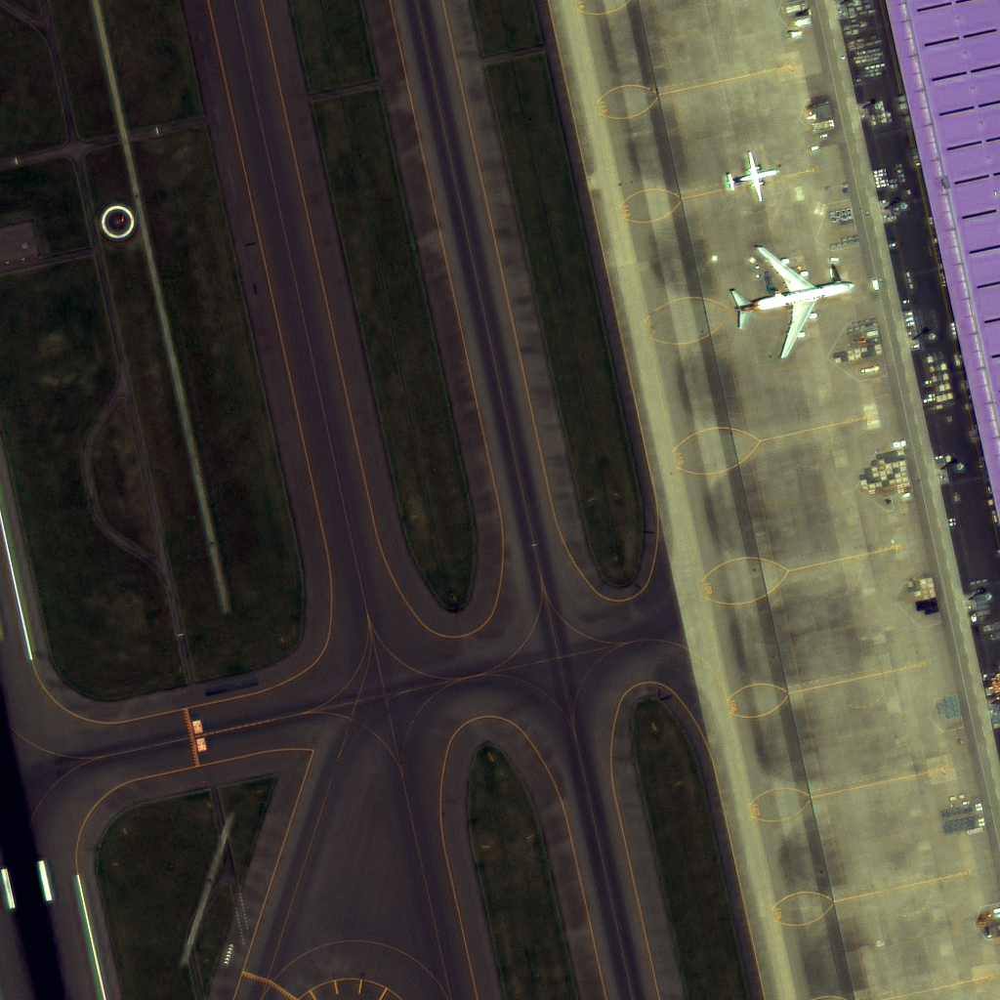

In [43]:

# 2. Pick a random image path
random_image_path = random.choice(image_path_list)
# print(random_image_path)

# 3. Get image class from path name ( the image class is the name of the directory where the image is store)
image_class =random_image_path.parent.stem
# print(image_class)

# 4. Open image
img = Image.open(random_image_path)
# 5. print(metadata)
print(f"random image path: {random_image_path}")
print(f"Image class : {image_class}")
print(f"Image height: {img.height}")
print(f"Image width: {img.width}")
img

## 3-2. Pretraining Dataset

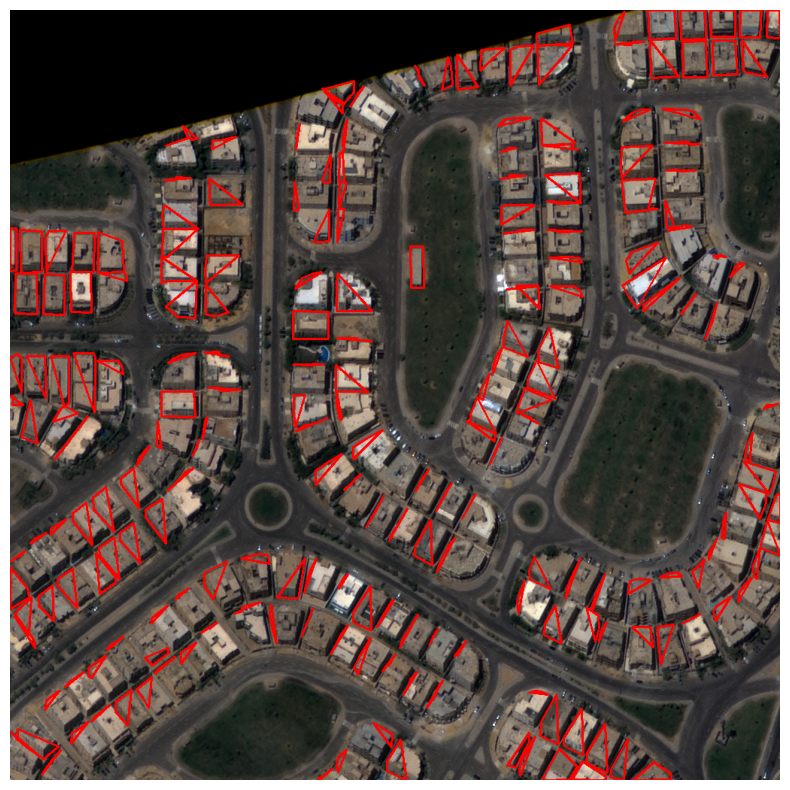

In [45]:
# Load the image
path2 = "./pretrain_data/Training/data/BLD00001_PS3_K3A_NIA0276.png"
img = cv2.imread(path2)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

path = "./pretrain_data/Training/label/BLD00001_PS3_K3A_NIA0276.json"
with open(path, "r") as json_file:
    data = json.load(json_file)

# Draw bounding boxes on the image
for feature in data['features']:
    imcoords = feature['properties']['building_imcoords']
    points = list(map(float, imcoords.split(',')))
    points = list(zip(points[::2], points[1::2]))  # Group the points
    points = [points[0], points[1], points[2],points[3], points[0]]  # Reorder points to draw bounding box
    points = np.array(points, np.int32)
    points = points.reshape((-1, 1, 2))
    img = cv2.polylines(img, [points], True, (255, 0, 0), 2)  # Draw the bounding box

# Display the image with bounding boxes
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.axis('off')
plt.show();

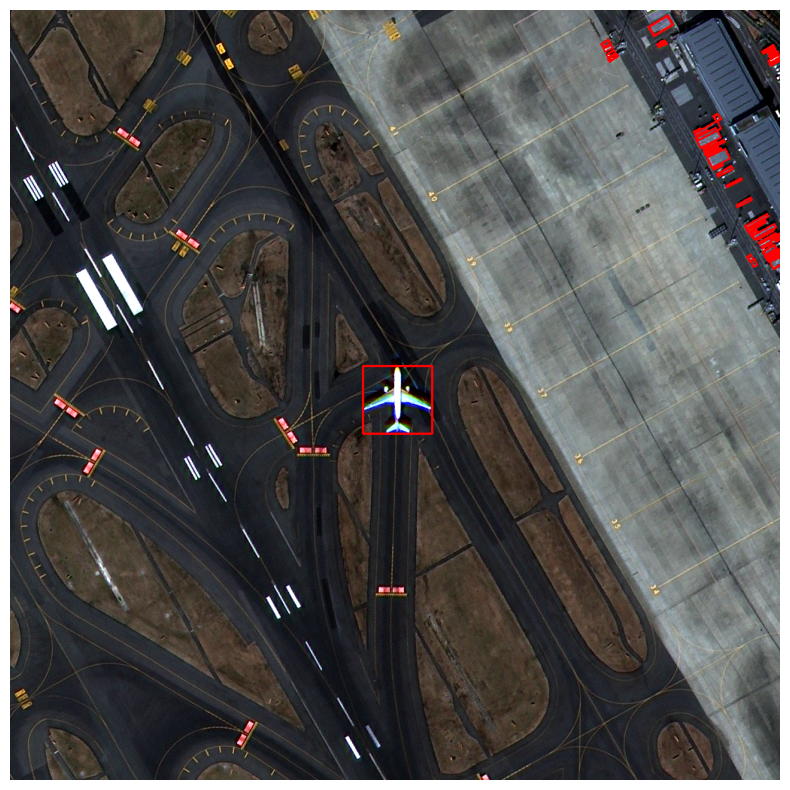

In [46]:
# Load the image
path2 = "./pretrain_data/Training/data/OBJ00013_PS3_K3_NIA0078.png"
img = cv2.imread(path2)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

path = "./pretrain_data/Training/label/OBJ00013_PS3_K3_NIA0078.json"
with open(path, "r") as json_file:
    data = json.load(json_file)

# Draw bounding boxes on the image
for feature in data['features']:
    imcoords = feature['properties']['object_imcoords']
    points = list(map(float, imcoords.split(',')))
    points = list(zip(points[::2], points[1::2]))  # Group the points
    points = [points[0], points[1], points[2],points[3], points[0]]  # Reorder points to draw bounding box
    points = np.array(points, np.int32)
    points = points.reshape((-1, 1, 2))
    img = cv2.polylines(img, [points], True, (255, 0, 0), 2)  # Draw the bounding box

# Display the image with bounding boxes
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.axis('off')
plt.show();

random image path: pretrain_data\Training\data\OBJ03895_PS3_K3A_NIA0164.png
Image class : data
Image height: 1024
Image width: 1024


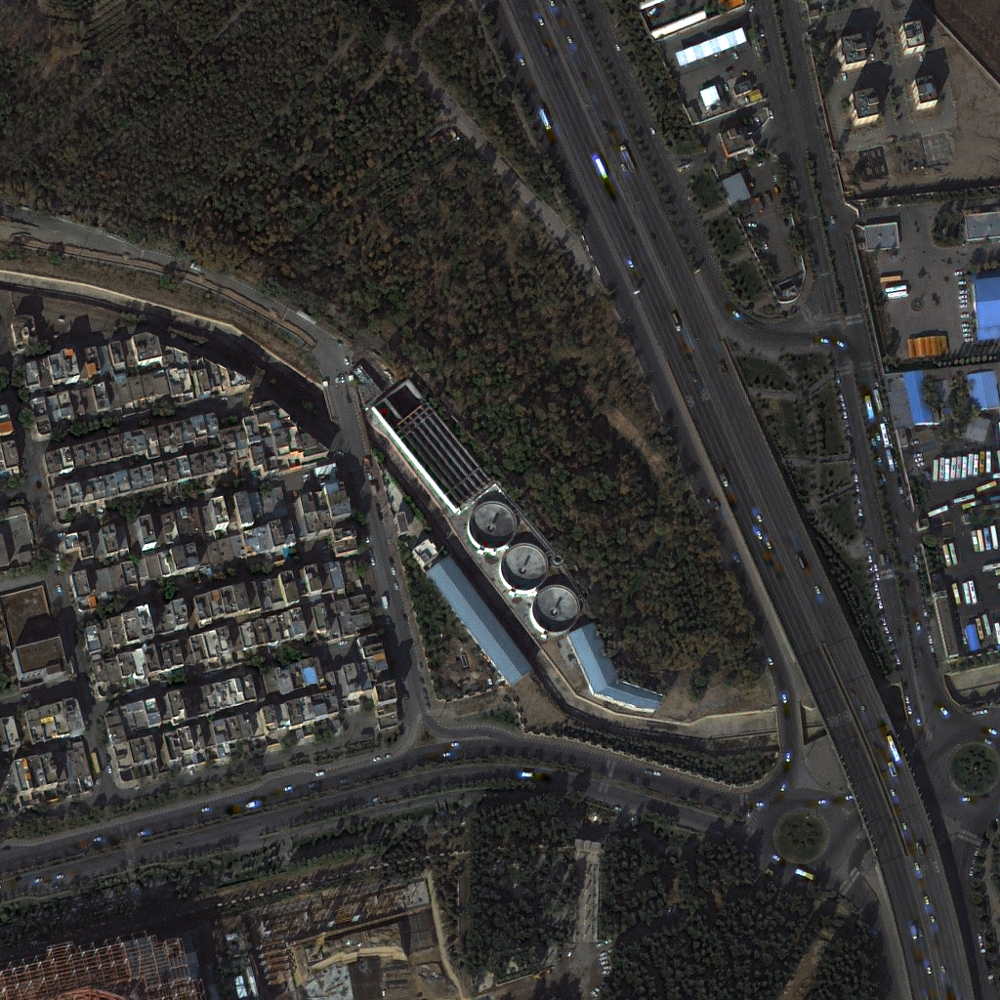

In [47]:

# 2. Pick a random image path
random_image_path = random.choice(train_image_path_list)
# print(random_image_path)

# 3. Get image class from path name ( the image class is the name of the directory where the image is store)
image_class =random_image_path.parent.stem
# print(image_class)

# 4. Open image
img = Image.open(random_image_path)
# 5. print(metadata)
print(f"random image path: {random_image_path}")
print(f"Image class : {image_class}")
print(f"Image height: {img.height}")
print(f"Image width: {img.width}")
img

# 4. 변수 선택 및 모델 구축
- Scartch 파일을 통한 모델 학습(Pretrain X)
- 학습결과 성능 및 속도가 유효한 yolo v8m 모델 사용
- pretrain 모델 구축 후(4-1), finetuning 수행(4-2)

## 4-1. Yolo v8m model(Make Pretrain model)

In [2]:
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:<2100>"

In [3]:
model = YOLO('yolov8m.yaml') # yaml파일을 통한 yolov8m 모델 생성


                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics.nn.modules.conv.Conv             [384

In [4]:
model.train(data='pretrain_data2.yaml'
            , epochs= 1000
            , pretrained=False # 사전학습모델 사용 X
            , device = 0
            , batch = 16
            , lr0 = 0.01
            , lrf= 0.1
            ,resume = False # 추가학습 X 
            # , seed= 0(모델 기본 고정값 '0')
            )

New https://pypi.org/project/ultralytics/8.0.141 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.140  Python-3.11.4 torch-2.0.1 CUDA:0 (NVIDIA GeForce RTX 4090, 24564MiB)
engine\trainer: task=detect, mode=train, model=yolov8m.yaml, data=pretrain_data2.yaml, epochs=1000, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, r

## 4-2. Yolo v8m model(Make Finetuning model)

In [48]:
model2 = YOLO('./runs/detect/train2/weights/last.pt') # yaml파일을 통한 yolov8n 모델 생성

In [51]:
model2.train(data='finetuning_data2.yaml'
            , epochs= 1000
            # , pretrained=False # 사전학습모델 사용 X
            , optimizer = 'SGD'
            , iou = 0.5
             , conf= 0.1
            , device = 0
            , batch = 16
            , lr0 = 0.001
            , lrf= 0.01
            ,resume = True # 추가학습(Finetuning)
            # , seed= 0(모델 기본 고정값 '0')
            )

New https://pypi.org/project/ultralytics/8.0.141 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.136  Python-3.11.4 torch-2.0.1 CUDA:0 (NVIDIA GeForce RTX 3060 Ti, 8192MiB)
engine\trainer: task=detect, mode=train, model=runs\detect\train2\weights\last.pt, data=pretrain_data2.yaml, epochs=1000, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nm

AssertionError: runs\detect\train2\weights\last.pt training to 1000 epochs is finished, nothing to resume.
Start a new training without resuming, i.e. 'yolo train model=runs\detect\train2\weights\last.pt'

In [52]:
model3 = YOLO('./runs/detect/train2/weights/best.pt') # yaml파일을 통한 yolov8n 모델 생성

In [53]:
model3.train(data='finetuning_data2.yaml'
            , epochs= 1000
            # , pretrained=False # 사전학습모델 사용 X
            , optimizer = 'SGD'
            , iou = 0.5
             , conf= 0.1
            , device = 0
            , batch = 16
            , lr0 = 0.001
            , lrf= 0.01
            ,resume = True # 추가학습(Finetuning)
            # , seed= 0(모델 기본 고정값 '0')
            )

New https://pypi.org/project/ultralytics/8.0.141 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.136  Python-3.11.4 torch-2.0.1 CUDA:0 (NVIDIA GeForce RTX 3060 Ti, 8192MiB)
engine\trainer: task=detect, mode=train, model=runs\detect\train2\weights\best.pt, data=pretrain_data2.yaml, epochs=1000, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nm

AssertionError: runs\detect\train2\weights\best.pt training to 1000 epochs is finished, nothing to resume.
Start a new training without resuming, i.e. 'yolo train model=runs\detect\train2\weights\best.pt'

# 5. 모델 학습 및 검증

## 5-1. Yolo v8n


image 1/1 D:\yolov8n\data\valid_images\OBJ00607_PS3_K3_NIA0086.png: 640x640 300 containers, 247.9ms
Speed: 7.0ms preprocess, 247.9ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


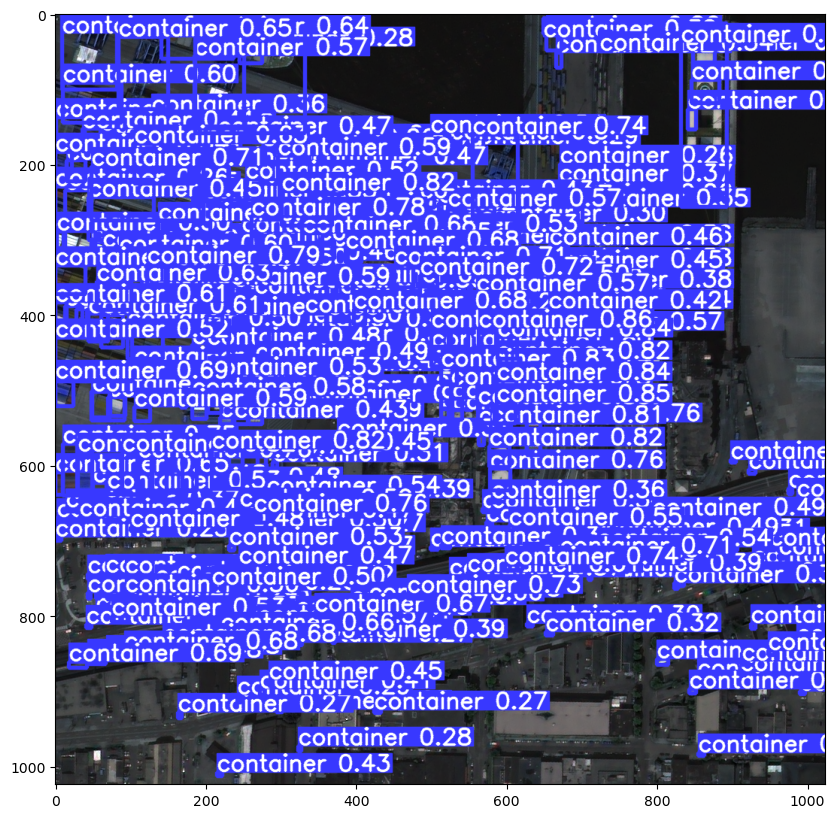

In [58]:
file_path = Path("D:/yolov8n/data/valid_images/OBJ00607_PS3_K3_NIA0086.png")
results = model3.predict(file_path
                    , save=False
                    , conf=0.1
                    , iou= 0.5
                    )
results_plot=results[0].plot()
plt.figure(figsize=(10, 10))
plt.imshow(results_plot)
plt.show();

In [56]:
metrics = model2.val(iou=0.5, conf=0.1)
metrics.box.map


Ultralytics YOLOv8.0.136  Python-3.11.4 torch-2.0.1 CUDA:0 (NVIDIA GeForce RTX 3060 Ti, 8192MiB)
val: Scanning D:\yolov8n\pretrain_data2\valid\labels.cache... 379 images, 220 backgrounds, 0 corrupt: 100%|██████████| 379/379 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.27it/s]
                   all        379      22970      0.742      0.538      0.616      0.445
Speed: 0.4ms preprocess, 12.5ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to runs\detect\val


0.4452115130840958

## 5-2. Yolo v8m


image 1/1 D:\yolov8n\data\valid_images\OBJ00607_PS3_K3_NIA0086.png: 640x640 300 containers, 173.4ms
Speed: 4.0ms preprocess, 173.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


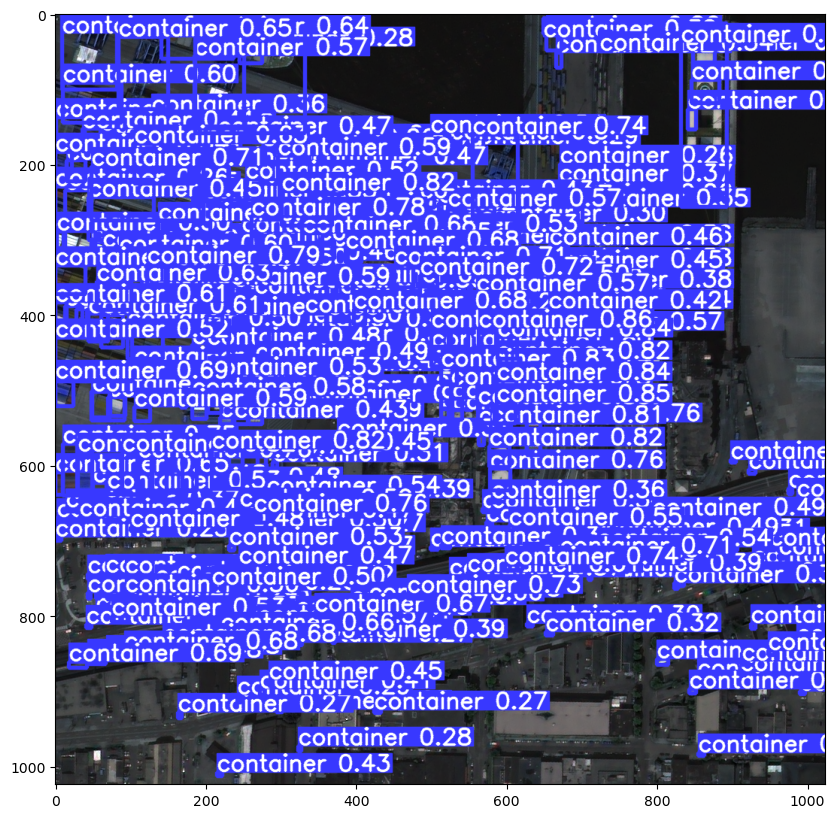

In [59]:
%matplotlib inline
file_path = Path("D:/yolov8n/data/valid_images/OBJ00607_PS3_K3_NIA0086.png")
results = model3.predict(file_path
                    , save=False
                    , conf=0.1
                    , iou= 0.5
                    )
results_plot=results[0].plot()
plt.figure(figsize=(10, 10))
plt.imshow(results_plot)
plt.show();

In [60]:
metrics = model3.val(iou=0.5, conf=0.1)
metrics.box.map

Ultralytics YOLOv8.0.136  Python-3.11.4 torch-2.0.1 CUDA:0 (NVIDIA GeForce RTX 3060 Ti, 8192MiB)
val: Scanning D:\yolov8n\pretrain_data2\valid\labels.cache... 379 images, 220 backgrounds, 0 corrupt: 100%|██████████| 379/379 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.29it/s]
                   all        379      22970      0.743      0.537      0.616      0.446
Speed: 0.3ms preprocess, 11.9ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs\detect\val2


0.44596816707918974

# 6. 제출파일 작성

In [62]:
# Create an empty dataframe to store the results
df = pd.DataFrame()

# Path to the directory with the images
dir_path = Path("D:/yolov8n/data/valid_images")

# Loop over all .png files in the directory
for file_path in dir_path.glob("*.png"):
    # Make a prediction for the current image
    results = model2.predict(file_path
                        , save=False
                        , conf=0.1
                        , iou= 0.5
                        )
    results = results[0].cpu().numpy()

    # Get the bounding boxes from the results
    bbox = results.boxes.xyxy
    box = results.boxes
    # Create a dataframe from the bounding boxes
    target = pd.DataFrame(bbox)
    target["x3"] = target[2]
    target["y3"] = target[1]
    target["x4"] = target[0]
    target["y4"] = target[3]
    target["File"] = [file_path.stem[:8]] * len(target)
    target["Confidence"] = box.conf

    # Rename and reorder the columns
    target = target.rename(columns={0: "x1", 1: "y1", 2: "x2", 3: "y2"})
    
    target = target[["File","Confidence","x1", "y1", "x3", "y3", "x2", "y2", "x4", "y4"]]
    target.columns = ["File","Confidence","x1", "y1", "x2", "y2", "x3", "y3", "x4", "y4"]

    # Set the index to the first 8 characters of the file name
    

    # Append the results to the main dataframe
    df = pd.concat([df, target])

# Display the first few rows of the dataframe
df.head()


image 1/1 D:\yolov8n\data\valid_images\OBJ00607_PS3_K3_NIA0086.png: 640x640 300 containers, 201.5ms
Speed: 7.2ms preprocess, 201.5ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\yolov8n\data\valid_images\OBJ01347_PS3_K3_NIA0092.png: 640x640 19 containers, 99.6ms
Speed: 4.0ms preprocess, 99.6ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\yolov8n\data\valid_images\OBJ01357_PS3_K3_NIA0092.png: 640x640 12 containers, 14.0ms
Speed: 3.0ms preprocess, 14.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\yolov8n\data\valid_images\OBJ01527_PS3_K3_NIA0095.png: 640x640 197 containers, 15.0ms
Speed: 3.0ms preprocess, 15.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\yolov8n\data\valid_images\OBJ01675_PS3_K3_NIA0102.png: 640x640 42 containers, 14.0ms
Speed: 3.0ms preprocess, 14.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\yo

,File,Confidence,x1,y1,x2,y2,x3,y3,x4,y4
0,OBJ00607,0.862613,563.242859,417.775391,585.667358,417.775391,585.667358,442.236237,563.242859,442.236237
1,OBJ00607,0.860359,500.355225,417.830322,523.524292,417.830322,523.524292,442.304657,500.355225,442.304657
2,OBJ00607,0.846438,588.649536,430.076660,614.212402,430.076660,614.212402,458.280182,588.649536,458.280182
3,OBJ00607,0.842557,302.360565,235.582443,367.875854,235.582443,367.875854,281.468536,302.360565,281.468536
4,OBJ00607,0.837817,89.437798,582.285583,109.120461,582.285583,109.120461,638.831482,89.437798,638.831482


In [63]:
df.loc[df["Confidence"]<0.1]

,File,Confidence,x1,y1,x2,y2,x3,y3,x4,y4


In [64]:
len(df)

33648

In [65]:
df.to_csv("submission_a.csv")

In [66]:
# Create an empty dataframe to store the results
df = pd.DataFrame()

# Path to the directory with the images
dir_path = Path("D:/yolov8n/data/valid_images")

# Loop over all .png files in the directory
for file_path in dir_path.glob("*.png"):
    # Make a prediction for the current image
    results = model3.predict(file_path
                        , save=False
                        , conf=0.1
                        , iou= 0.5
                        )
    results = results[0].cpu().numpy()

    # Get the bounding boxes from the results
    bbox = results.boxes.xyxy
    box = results.boxes
    # Create a dataframe from the bounding boxes
    target = pd.DataFrame(bbox)
    target["x3"] = target[2]
    target["y3"] = target[1]
    target["x4"] = target[0]
    target["y4"] = target[3]
    target["File"] = [file_path.stem[:8]] * len(target)
    target["Confidence"] = box.conf

    # Rename and reorder the columns
    target = target.rename(columns={0: "x1", 1: "y1", 2: "x2", 3: "y2"})
    
    target = target[["File","Confidence","x1", "y1", "x3", "y3", "x2", "y2", "x4", "y4"]]
    target.columns = ["File","Confidence","x1", "y1", "x2", "y2", "x3", "y3", "x4", "y4"]

    # Set the index to the first 8 characters of the file name
    

    # Append the results to the main dataframe
    df = pd.concat([df, target])

# Display the first few rows of the dataframe
df.head()


image 1/1 D:\yolov8n\data\valid_images\OBJ00607_PS3_K3_NIA0086.png: 640x640 300 containers, 244.4ms
Speed: 4.0ms preprocess, 244.4ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\yolov8n\data\valid_images\OBJ01347_PS3_K3_NIA0092.png: 640x640 15 containers, 15.0ms
Speed: 3.0ms preprocess, 15.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\yolov8n\data\valid_images\OBJ01357_PS3_K3_NIA0092.png: 640x640 15 containers, 14.0ms
Speed: 3.0ms preprocess, 14.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\yolov8n\data\valid_images\OBJ01527_PS3_K3_NIA0095.png: 640x640 199 containers, 14.0ms
Speed: 3.0ms preprocess, 14.0ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\yolov8n\data\valid_images\OBJ01675_PS3_K3_NIA0102.png: 640x640 40 containers, 16.0ms
Speed: 3.0ms preprocess, 16.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\yo

,File,Confidence,x1,y1,x2,y2,x3,y3,x4,y4
0,OBJ00607,0.858064,563.034973,417.512512,586.025208,417.512512,586.025208,442.311249,563.034973,442.311249
1,OBJ00607,0.847700,500.209198,417.457184,523.929138,417.457184,523.929138,442.083740,500.209198,442.083740
2,OBJ00607,0.847547,587.516724,516.252441,612.412048,516.252441,612.412048,544.208923,587.516724,544.208923
3,OBJ00607,0.843879,588.408325,429.923553,614.867310,429.923553,614.867310,458.189941,588.408325,458.189941
4,OBJ00607,0.841002,587.491821,487.290527,613.180664,487.290527,613.180664,515.394226,587.491821,515.394226


In [67]:
df.loc[df["Confidence"]<0.1]

,File,Confidence,x1,y1,x2,y2,x3,y3,x4,y4


In [68]:
len(df)

33679

In [69]:
df.to_csv("submission_b.csv")